<h1> NBA Player Improvement Predictor </h1> 

This project intends to build a model which can predict the improvement of an NBA player this year, based on his statistics of the past year. This model can be useful to NBA executives who are looking to trade players in both situations of:
 - Getting a new player into their team
 - Deciding whether to keep a player in the team or not

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

In [2]:
nba_data_raw = pd.read_csv(r'C:\\Users\\ASUS\\Desktop\\Kaggle\\NBA Data\\NBAData.csv')
nba_data_ws_raw = pd.read_csv(r'C:\\Users\\ASUS\\Desktop\\Kaggle\\NBA Data\\Seasons_Stats.csv')[["Year","Player","Age","Tm","WS","WS/48"]]

In [3]:
nba_data_ws_raw.head(10)

,Year,Player,Age,Tm,WS,WS/48
0,1950.0,Curly Armstrong,31.0,FTW,3.5,NaN
1,1950.0,Cliff Barker,29.0,INO,2.2,NaN
2,1950.0,Leo Barnhorst,25.0,CHS,3.6,NaN
3,1950.0,Ed Bartels,24.0,TOT,-0.6,NaN
4,1950.0,Ed Bartels,24.0,DNN,-0.6,NaN
5,1950.0,Ed Bartels,24.0,NYK,0.0,NaN
6,1950.0,Ralph Beard,22.0,INO,4.8,NaN
7,1950.0,Gene Berce,23.0,TRI,-0.1,NaN
8,1950.0,Charlie Black,28.0,TOT,2.8,NaN
9,1950.0,Charlie Black,28.0,FTW,1.5,NaN


In [4]:
'''
prior_name = ""
nba_data_raw["Start Year"] = np.nan
start_year = int(nba_data_raw.iloc[0,1].split('-')[0])
nba_data_raw["Start Year"].iloc[0] = start_year
for i in range(1,nba_data_raw.shape[0]):
    prior_name = nba_data_raw.iloc[i-1,0]
    current_name = nba_data_raw.iloc[i,0]
    if current_name != prior_name:
        start_year = int(nba_data_raw.iloc[i,1].split('-')[0])
        nba_data_raw["Start Year"].iloc[i] = start_year
    else:
        nba_data_raw["Start Year"].iloc[i] = start_year
'''

'\nprior_name = ""\nnba_data_raw["Start Year"] = np.nan\nstart_year = int(nba_data_raw.iloc[0,1].split(\'-\')[0])\nnba_data_raw["Start Year"].iloc[0] = start_year\nfor i in range(1,nba_data_raw.shape[0]):\n    prior_name = nba_data_raw.iloc[i-1,0]\n    current_name = nba_data_raw.iloc[i,0]\n    if current_name != prior_name:\n        start_year = int(nba_data_raw.iloc[i,1].split(\'-\')[0])\n        nba_data_raw["Start Year"].iloc[i] = start_year\n    else:\n        nba_data_raw["Start Year"].iloc[i] = start_year\n'

In [5]:
#adjusting the year field to season
nba_data_ws = nba_data_ws_raw.loc[nba_data_ws_raw["Year"] >= 1981]
nba_data_ws["Season"] = nba_data_ws["Year"].apply(lambda x: str(int(x - 1)) + '-' + str(int(x))[-2:])


In [6]:
nba_data_ws["Surname"] = nba_data_ws["Player"].apply(lambda x:x.split()[1])
nba_data_ws["First Name"] = nba_data_ws["Player"].apply(lambda x:x.split()[0])
nba_data_ws.sort_values(by = ["Surname","First Name","Year"],axis = 0).head(20)


,Year,Player,Age,Tm,WS,WS/48,Season,Surname,First Name
10007,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
10449,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
10908,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
10909,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
10910,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
11358,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
11840,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
11841,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
11842,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
6085,1981.0,Kareem Abdul-Jabbar*,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar*,Kareem


In [7]:
nba_data_ws.sort_values(by = ["Surname","First Name","Year"],axis = 0,inplace=True)
nba_data_ws.head(30)

,Year,Player,Age,Tm,WS,WS/48,Season,Surname,First Name
10007,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
10449,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
10908,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
10909,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
10910,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
11358,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
11840,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
11841,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
11842,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
6085,1981.0,Kareem Abdul-Jabbar*,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar*,Kareem


In [8]:
'''
nba_data_ws.drop('Surname',axis = 1, inplace=True)
'''
nba_data_ws.reset_index(drop = True, inplace = True)
nba_data_ws.head(10)

,Year,Player,Age,Tm,WS,WS/48,Season,Surname,First Name
0,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
1,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
2,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
3,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
4,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
5,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
6,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
7,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
8,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
9,1981.0,Kareem Abdul-Jabbar*,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar*,Kareem


In [9]:
nba_data_ws["Player"] = nba_data_ws["Player"].apply(lambda x: x.strip('*'))
nba_data_ws.head(20)

,Year,Player,Age,Tm,WS,WS/48,Season,Surname,First Name
0,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
1,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
2,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
3,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
4,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
5,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
6,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
7,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
8,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
9,1981.0,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar*,Kareem


In [10]:
nba_data_ws["Surname"] = nba_data_ws["Surname"].apply(lambda x: x.strip('*'))
nba_data_ws.head(20)

,Year,Player,Age,Tm,WS,WS/48,Season,Surname,First Name
0,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
1,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
2,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
3,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
4,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
5,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
6,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
7,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
8,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
9,1981.0,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar,Kareem


In [11]:
nba_data_ws.drop("Year",axis = 1, inplace = True)

In [12]:
#1) Obtain only TOT and remove other instances of same season
#2) Remove seasons where one plays less than 20 games less than 100 minutes per season
#There are a lot of situations where the same player plays for multiple teams in the same season as they are traded during the season. Such players have a TOT entry as for Team ("Tm")

nba_data_raw.loc[nba_data_raw["Tm"] == "TOT"]

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990
6,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990
42,4,Tariq Abdul-Wahad,1999-00,25.0,TOT,NBA,SG,61.0,56.0,25.9,...,1.7,3.1,4.8,1.6,1.0,0.5,1.7,2.4,11.4,1997
46,4,Tariq Abdul-Wahad,2001-02,27.0,TOT,NBA,SG,24.0,12.0,18.4,...,1.7,1.8,3.5,1.0,0.8,0.4,1.1,2.3,5.6,1997
57,5,Shareef Abdur-Rahim,2003-04,27.0,TOT,NBA,PF,85.0,56.0,31.6,...,2.2,5.3,7.5,2.0,0.8,0.4,2.2,2.6,16.3,1996
68,6,Tom Abernethy,1980-81,26.0,TOT,NBA,SF,39.0,NaN,7.6,...,0.5,0.7,1.2,0.5,0.2,0.1,0.2,0.9,1.6,1976
78,9,Alex Acker,2008-09,26.0,TOT,NBA,SG,25.0,0.0,8.0,...,0.3,0.6,1.0,0.5,0.2,0.2,0.3,0.4,2.9,2005
86,10,Mark Acres,1992-93,30.0,TOT,NBA,C,18.0,7.0,14.9,...,1.4,2.3,3.7,0.3,0.2,0.3,0.7,1.9,3.6,1985
90,11,Quincy Acy,2013-14,23.0,TOT,NBA,SF,63.0,0.0,13.4,...,1.1,2.3,3.4,0.4,0.4,0.4,0.5,1.9,2.7,2012
95,11,Quincy Acy,2016-17,26.0,TOT,NBA,PF,38.0,1.0,14.7,...,0.5,2.5,3.0,0.5,0.4,0.4,0.6,1.8,5.8,2012


In [13]:
collist = nba_data_raw.columns.tolist()[1:-1]
nan_idx = nba_data_raw[nba_data_raw[collist].isnull().apply(lambda x:all(x),axis = 1)].index.values.tolist()
nba_data_raw = nba_data_raw.drop(nan_idx).reset_index(drop = True)
nba_data_raw[:40]

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990
3,1,Alaa Abdelnaby,1992-93,24.0,MIL,NBA,PF,12.0,0.0,13.3,...,1.0,2.1,3.1,0.8,0.5,0.3,1.1,2.0,5.3,1990
4,1,Alaa Abdelnaby,1992-93,24.0,BOS,NBA,PF,63.0,52.0,18.3,...,1.8,3.0,4.8,0.3,0.3,0.3,1.3,2.6,8.2,1990
5,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990
6,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990
7,1,Alaa Abdelnaby,1994-95,26.0,SAC,NBA,PF,51.0,0.0,9.3,...,0.7,1.4,2.1,0.3,0.3,0.2,0.8,2.0,5.0,1990
8,1,Alaa Abdelnaby,1994-95,26.0,PHI,NBA,PF,3.0,0.0,10.0,...,1.0,1.7,2.7,0.0,0.0,0.0,1.7,0.7,0.7,1990
9,2,Kareem Abdul-Jabbar,1969-70,22.0,MIL,NBA,C,82.0,NaN,43.1,...,NaN,NaN,14.5,4.1,NaN,NaN,NaN,3.5,28.8,1969


In [14]:

import unidecode

nba_data_raw["Name"] = nba_data_raw["Name"].apply(lambda x: unidecode.unidecode(x))

'''
#nba_data_raw.loc[nba_data_raw["PlayerID"] == 1108]
unidecode.unidecode(nba_data_raw.iloc[9,:]["Name"])
'''

'\n#nba_data_raw.loc[nba_data_raw["PlayerID"] == 1108]\nunidecode.unidecode(nba_data_raw.iloc[9,:]["Name"])\n'

In [15]:
nba_data_raw.loc[nba_data_raw["PlayerID"] == 1404]

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
9959,1404,Sarunas Jasikevicius,2005-06,29.0,IND,NBA,PG,75.0,15.0,20.8,...,0.3,1.8,2.0,3.0,0.5,0.1,1.5,1.4,7.3,Undrafted
9960,1404,Sarunas Jasikevicius,2006-07,30.0,TOT,NBA,"PG,SG",63.0,3.0,15.4,...,0.2,0.9,1.1,2.7,0.4,0.0,1.4,1.2,6.1,Undrafted
9961,1404,Sarunas Jasikevicius,2006-07,30.0,IND,NBA,SG,37.0,1.0,17.9,...,0.3,1.0,1.3,3.0,0.4,0.0,1.6,1.4,7.4,Undrafted
9962,1404,Sarunas Jasikevicius,2006-07,30.0,GSW,NBA,PG,26.0,2.0,11.9,...,0.2,0.6,0.8,2.3,0.5,0.0,1.2,0.8,4.3,Undrafted


In [16]:
nba_data_ws.loc[nba_data_ws["Tm"] == "TOT"]

,Player,Age,Tm,WS,WS/48,Season,Surname,First Name
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
6,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
29,Tariq Abdul-Wahad,25.0,TOT,2.2,0.068,1999-00,Abdul-Wahad,Tariq
33,Tariq Abdul-Wahad,27.0,TOT,0.0,-0.003,2001-02,Abdul-Wahad,Tariq
44,Shareef Abdur-Rahim,27.0,TOT,8.1,0.145,2003-04,Abdur-Rahim,Shareef
51,Tom Abernethy,26.0,TOT,0.4,0.062,1980-81,Abernethy,Tom
56,Alex Acker,26.0,TOT,0.0,-0.011,2008-09,Acker,Alex
64,Mark Acres,30.0,TOT,0.3,0.056,1992-93,Acres,Mark
68,Quincy Acy,23.0,TOT,1.5,0.086,2013-14,Acy,Quincy
73,Quincy Acy,26.0,TOT,0.9,0.082,2016-17,Acy,Quincy


In [17]:
nba_data_ws.rename(columns = {"Player":"Name"},inplace= True)
nba_data_ws.head()

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name
0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
1,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
3,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
4,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa


In [60]:
nba_data_ws.loc[nba_data_ws["Name"] == "Adrian Dantley"]

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name
3873,Adrian Dantley,24.0,UTA,13.6,0.191,1980-81,Dantley,Adrian
3874,Adrian Dantley,25.0,UTA,12.6,0.187,1981-82,Dantley,Adrian
3875,Adrian Dantley,26.0,UTA,4.3,0.232,1982-83,Dantley,Adrian
3876,Adrian Dantley,27.0,UTA,14.6,0.235,1983-84,Dantley,Adrian
3877,Adrian Dantley,28.0,UTA,8.0,0.194,1984-85,Dantley,Adrian
3878,Adrian Dantley,29.0,UTA,12.8,0.223,1985-86,Dantley,Adrian
3879,Adrian Dantley,30.0,DET,10.3,0.181,1986-87,Dantley,Adrian
3880,Adrian Dantley,31.0,DET,9.4,0.210,1987-88,Dantley,Adrian
3881,Adrian Dantley,32.0,TOT,7.4,0.147,1988-89,Dantley,Adrian
3882,Adrian Dantley,32.0,DET,5.3,0.191,1988-89,Dantley,Adrian


In [62]:
nba_data_raw.loc[nba_data_raw["Name"] == "Adrian Dantley"]

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
4715,651,Adrian Dantley,1976-77,21.0,BUF,NBA,SF,77.0,NaN,36.6,...,3.3,4.4,7.6,1.9,1.2,0.2,NaN,2.8,20.3,1976
4716,651,Adrian Dantley,1977-78,22.0,TOT,NBA,SF,79.0,NaN,37.1,...,3.4,4.5,7.8,3.2,1.5,0.3,2.9,2.9,21.5,1976
4717,651,Adrian Dantley,1977-78,22.0,IND,NBA,SF,23.0,NaN,41.2,...,4.1,5.3,9.4,2.8,2.1,0.7,2.9,3.3,26.5,1976
4718,651,Adrian Dantley,1977-78,22.0,LAL,NBA,SF,56.0,NaN,35.4,...,3.1,4.2,7.2,3.4,1.3,0.1,2.9,2.8,19.4,1976
4719,651,Adrian Dantley,1978-79,23.0,LAL,NBA,SF,60.0,NaN,29.6,...,2.2,3.5,5.7,2.3,1.1,0.2,2.6,2.7,17.3,1976
4720,651,Adrian Dantley,1979-80,24.0,UTA,NBA,SF,68.0,NaN,39.3,...,2.7,4.9,7.6,2.8,1.4,0.2,3.4,3.1,28.0,1976
4721,651,Adrian Dantley,1980-81,25.0,UTA,NBA,SF,80.0,NaN,42.7,...,2.4,4.0,6.4,4.0,1.4,0.2,3.5,3.1,30.7,1976
4722,651,Adrian Dantley,1981-82,26.0,UTA,NBA,SF,81.0,81.0,39.8,...,2.9,3.5,6.3,4.0,1.2,0.2,3.7,3.1,30.3,1976
4723,651,Adrian Dantley,1982-83,27.0,UTA,NBA,SF,22.0,22.0,40.3,...,2.6,3.7,6.4,4.8,0.9,0.0,3.7,2.8,30.7,1976
4724,651,Adrian Dantley,1983-84,28.0,UTA,NBA,SF,79.0,79.0,37.8,...,2.3,3.4,5.7,3.9,0.8,0.1,3.3,2.5,30.6,1976


In [18]:
merged_df = pd.merge(nba_data_ws,nba_data_raw[["PlayerID","Name","Season","Tm","Age"]],how = 'inner',on=['Name','Season','Tm','Age'])
merged_df.head(30)

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name,PlayerID
0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa,1
1,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa,1
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa,1
3,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa,1
4,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa,1
5,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa,1
6,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa,1
7,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa,1
8,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa,1
9,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar,Kareem,2


In [64]:
merged_df.loc[merged_df["Name"] == "Adrian Dantley"]

,Name,Age,Tm,WS,WS/48,Season,PlayerID


In [19]:
merged_df.loc[merged_df["WS/48"].isna(),"WS/48"] = 0.0
merged_df.isnull().sum()

Name          0
Age           0
Tm            0
WS            0
WS/48         0
Season        0
Surname       0
First Name    0
PlayerID      0
dtype: int64

In [20]:
merged_df.to_csv("merged_data.csv",index = False)

In [21]:
#some players who were transferred in the middle of the season have there stats summed up to a row with TOT. This row shall be used for the players statistics for that year. Hence other entries for that year will be removed
idx_drop = []
key_list = list()
player_grp = nba_data_raw.groupby(['PlayerID','Name'])

for key,group in player_grp:
    key_list.append(key)

for key in key_list:
    player_stats = player_grp.get_group(key)
    years = player_stats.loc[player_stats['Tm'] == 'TOT']['Season'].tolist()
    idx = player_stats.loc[(player_stats['Season'].apply(lambda x: x in years)) & (player_stats['Tm'] != "TOT")].index.values.tolist()
    if len(idx) != 0:
        idx_drop.extend(idx)

In [22]:
#dropping all indices with entries which are not TOT for a given year
nba_data_df = nba_data_raw.drop(idx_drop).reset_index(drop = True)
nba_data_df.head(50)

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990
5,2,Kareem Abdul-Jabbar,1969-70,22.0,MIL,NBA,C,82.0,NaN,43.1,...,NaN,NaN,14.5,4.1,NaN,NaN,NaN,3.5,28.8,1969
6,2,Kareem Abdul-Jabbar,1970-71,23.0,MIL,NBA,C,82.0,NaN,40.1,...,NaN,NaN,16.0,3.3,NaN,NaN,NaN,3.2,31.7,1969
7,2,Kareem Abdul-Jabbar,1971-72,24.0,MIL,NBA,C,81.0,NaN,44.2,...,NaN,NaN,16.6,4.6,NaN,NaN,NaN,2.9,34.8,1969
8,2,Kareem Abdul-Jabbar,1972-73,25.0,MIL,NBA,C,76.0,NaN,42.8,...,NaN,NaN,16.1,5.0,NaN,NaN,NaN,2.7,30.2,1969
9,2,Kareem Abdul-Jabbar,1973-74,26.0,MIL,NBA,C,81.0,NaN,43.8,...,3.5,11.0,14.5,4.8,1.4,3.5,NaN,2.9,27.0,1969


In [23]:
idx_drop_ws = []
key_list_ws = list()
player_grp_ws = merged_df.groupby(['PlayerID','Name'])

for key,group in player_grp_ws:
    key_list_ws.append(key)

for key in key_list_ws:
    player_stats = player_grp_ws.get_group(key)
    years = player_stats.loc[player_stats['Tm'] == 'TOT']['Season'].tolist()
    idx = player_stats.loc[(player_stats['Season'].apply(lambda x: x in years)) & (player_stats['Tm'] != "TOT")].index.values.tolist()
    if len(idx) != 0:
        idx_drop_ws.extend(idx)

In [24]:
merged_df = merged_df.drop(idx_drop_ws).reset_index(drop = True)
merged_df.head(50)

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name,PlayerID
0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa,1
1,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa,1
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa,1
3,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa,1
4,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa,1
5,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar,Kareem,2
6,Kareem Abdul-Jabbar,34.0,LAL,10.7,0.192,1981-82,Abdul-Jabbar,Kareem,2
7,Kareem Abdul-Jabbar,35.0,LAL,10.9,0.205,1982-83,Abdul-Jabbar,Kareem,2
8,Kareem Abdul-Jabbar,36.0,LAL,8.9,0.163,1983-84,Abdul-Jabbar,Kareem,2
9,Kareem Abdul-Jabbar,37.0,LAL,11.2,0.204,1984-85,Abdul-Jabbar,Kareem,2


In [25]:
#there are players with the same name. Although there PlayerID is unique, we shall ammend there names to include there player ID with it
repeated_name_ids = []
def getplayerid(id_namepair,name):
    if id_namepair[1] == name:
        return [id_namepair[0]]

unique_names = list(set(nba_data_df["Name"]))
names = [i[1] for i in key_list]
player_ids = [i[0] for i in key_list]
#if repeated names were not next to each other, this would work
'''
for name in unique_names:
    if names.count(name) > 1:
        repeated_name_ids.extend(map(lambda id_namepair,name:getplayerid(id_namepair,name),key_list,[name]*len(key_list)))
'''
#as players with unique names will be listed next to each other as they were scraped off the web as such, we use the following technique to get the PlayerIDs of the repeated names
for name in unique_names:
    if names.count(name) > 1:
        repeated_name_ids.extend([player_ids[names.index(name)] + i for i in range(0,names.count(name))])

In [26]:
nba_data_df.loc[nba_data_df["PlayerID"].apply(lambda x:x in repeated_name_ids), "Name"] = nba_data_df["Name"] + "_" + nba_data_df["PlayerID"].astype(str)

nba_data_df.loc[nba_data_df["PlayerID"].apply(lambda x:x in repeated_name_ids)]

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
2135,365,Dee Brown_365,1990-91,22.0,BOS,NBA,PG,82.0,5.0,23.7,...,0.5,1.7,2.2,4.2,1.0,0.2,1.7,2.0,8.7,1990
2136,365,Dee Brown_365,1991-92,23.0,BOS,NBA,PG,31.0,20.0,28.5,...,0.5,2.1,2.5,5.3,1.1,0.2,1.9,2.4,11.7,1990
2137,365,Dee Brown_365,1992-93,24.0,BOS,NBA,PG,80.0,48.0,28.2,...,0.6,2.5,3.1,5.8,1.7,0.4,1.7,2.5,10.9,1990
2138,365,Dee Brown_365,1993-94,25.0,BOS,NBA,SG,77.0,76.0,37.2,...,0.8,3.1,3.9,4.5,2.0,0.6,1.6,2.7,15.5,1990
2139,365,Dee Brown_365,1994-95,26.0,BOS,NBA,SG,79.0,69.0,35.3,...,0.8,2.4,3.2,3.8,1.4,0.6,1.8,2.3,15.6,1990
2140,365,Dee Brown_365,1995-96,27.0,BOS,NBA,PG,65.0,23.0,24.5,...,0.6,1.5,2.1,2.2,1.2,0.2,1.1,1.8,10.7,1990
2141,365,Dee Brown_365,1996-97,28.0,BOS,NBA,PG,21.0,2.0,24.9,...,0.4,1.9,2.3,3.2,1.5,0.3,1.1,2.1,7.6,1990
2142,365,Dee Brown_365,1997-98,29.0,TOT,NBA,SG,72.0,12.0,23.9,...,0.3,1.8,2.1,2.1,1.1,0.3,1.0,1.7,9.1,1990
2143,365,Dee Brown_365,1998-99,30.0,TOR,NBA,PG,49.0,0.0,28.1,...,0.3,1.8,2.1,2.9,1.1,0.2,1.6,1.5,11.2,1990
2144,365,Dee Brown_365,1999-00,31.0,TOR,NBA,PG,38.0,12.0,17.7,...,0.2,1.2,1.4,2.3,0.6,0.1,1.0,1.6,6.9,1990


In [27]:
repeated_name_ids_ws = []
unique_names_ws = list(set(merged_df["Name"]))
names_ws = [i[1] for i in key_list_ws]
player_ids_ws = [i[0] for i in key_list_ws]

for name in unique_names_ws:
    if names_ws.count(name) > 1:
        repeated_name_ids_ws.extend([player_ids_ws[names_ws.index(name)] + i for i in range(0,names_ws.count(name))])

In [28]:
merged_df.loc[merged_df["PlayerID"].apply(lambda x:x in repeated_name_ids_ws), "Name"] = merged_df["Name"] + "_" + merged_df["PlayerID"].astype(str)

merged_df.loc[merged_df["PlayerID"].apply(lambda x:x in repeated_name_ids_ws)]

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name,PlayerID
1737,Dee Brown_365,22.0,BOS,3.5,0.087,1990-91,Brown,Dee,365
1738,Dee Brown_365,23.0,BOS,1.0,0.055,1991-92,Brown,Dee,365
1739,Dee Brown_365,24.0,BOS,6.4,0.135,1992-93,Brown,Dee,365
1740,Dee Brown_365,25.0,BOS,6.4,0.108,1993-94,Brown,Dee,365
1741,Dee Brown_365,26.0,BOS,6.8,0.117,1994-95,Brown,Dee,365
1742,Dee Brown_365,27.0,BOS,2.4,0.073,1995-96,Brown,Dee,365
1743,Dee Brown_365,28.0,BOS,0.3,0.030,1996-97,Brown,Dee,365
1744,Dee Brown_365,29.0,TOT,3.4,0.095,1997-98,Brown,Dee,365
1745,Dee Brown_365,30.0,TOR,2.5,0.086,1998-99,Brown,Dee,365
1746,Dee Brown_365,31.0,TOR,0.8,0.057,1999-00,Brown,Dee,365


In [29]:
#As the 2020-2021 Season it still going on, this season will be dropped from any data analysis and training that is to be done 

nba_data_df = nba_data_df.drop(nba_data_df.loc[nba_data_df["Season"] == "2020-21"].index.values.tolist()).reset_index(drop = True)
nba_data_df.loc[nba_data_df["Season"] == "2020-21"].index.values.tolist()

[]

In [30]:
#Dropping all seasons prior to the 1980-1981 season
before1980_seasons = [i for i in nba_data_df["Season"].unique().tolist() if int(i.split('-')[0])<1980]

nba_data_df = nba_data_df.drop(nba_data_df.loc[nba_data_df["Season"].apply(lambda x : x in before1980_seasons)].index.values.tolist()).reset_index(drop = True)
nba_data_df.head(30)

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990
5,2,Kareem Abdul-Jabbar,1980-81,33.0,LAL,NBA,C,80.0,NaN,37.2,...,2.5,7.8,10.3,3.4,0.7,2.9,3.1,3.1,26.2,1969
6,2,Kareem Abdul-Jabbar,1981-82,34.0,LAL,NBA,C,76.0,76.0,35.2,...,2.3,6.4,8.7,3.0,0.8,2.7,3.0,2.9,23.9,1969
7,2,Kareem Abdul-Jabbar,1982-83,35.0,LAL,NBA,C,79.0,79.0,32.3,...,2.1,5.4,7.5,2.5,0.8,2.2,2.5,2.8,21.8,1969
8,2,Kareem Abdul-Jabbar,1983-84,36.0,LAL,NBA,C,80.0,80.0,32.8,...,2.1,5.2,7.3,2.6,0.7,1.8,2.8,2.6,21.5,1969
9,2,Kareem Abdul-Jabbar,1984-85,37.0,LAL,NBA,C,79.0,79.0,33.3,...,2.1,5.8,7.9,3.2,0.8,2.1,2.5,3.0,22.0,1969


In [31]:
#We shall only use data from 1980-81 to 2016-2017 season as we only have WS values for this period of time
after2017_seasons = [i for i in nba_data_df["Season"] if int(i.split('-')[0])>=2017]

nba_data_df = nba_data_df.drop(nba_data_df.loc[nba_data_df["Season"].apply(lambda x: x in after2017_seasons)].index.values.tolist()).reset_index(drop = True)


In [32]:
nba_data_df.loc[nba_data_df["Season"] == "2019-20"].index.values.tolist()

[]

In [33]:
merged_df.head(20)

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name,PlayerID
0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa,1
1,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa,1
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa,1
3,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa,1
4,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa,1
5,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar,Kareem,2
6,Kareem Abdul-Jabbar,34.0,LAL,10.7,0.192,1981-82,Abdul-Jabbar,Kareem,2
7,Kareem Abdul-Jabbar,35.0,LAL,10.9,0.205,1982-83,Abdul-Jabbar,Kareem,2
8,Kareem Abdul-Jabbar,36.0,LAL,8.9,0.163,1983-84,Abdul-Jabbar,Kareem,2
9,Kareem Abdul-Jabbar,37.0,LAL,11.2,0.204,1984-85,Abdul-Jabbar,Kareem,2


In [41]:
merged_df.drop(['Surname','First Name'], axis = 1,inplace=True)
merged_df.head(10)

,Name,Age,Tm,WS,WS/48,Season,PlayerID
0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,1
1,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,1
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,1
3,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,1
4,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,1
5,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,2
6,Kareem Abdul-Jabbar,34.0,LAL,10.7,0.192,1981-82,2
7,Kareem Abdul-Jabbar,35.0,LAL,10.9,0.205,1982-83,2
8,Kareem Abdul-Jabbar,36.0,LAL,8.9,0.163,1983-84,2
9,Kareem Abdul-Jabbar,37.0,LAL,11.2,0.204,1984-85,2


In [42]:
final_df = pd.merge(nba_data_df, merged_df, how='left',on=['PlayerID','Name','Season','Tm','Age'])
final_df.head()

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990,0.5,0.079
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990,2.1,0.110
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990,2.0,0.074
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990,-0.1,-0.032
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990,0.3,0.027


In [68]:
final_df.drop(final_df.loc[final_df["WS"].isna()].index.tolist(), inplace = True)
final_df.isna().sum()

PlayerID         0
Name             0
Season           0
Age              0
Tm               0
Lg               0
Pos              0
G                0
GS             275
MP               0
FG               0
FGA              0
FG%             44
3P               0
3PA              0
3P%           2484
2P               0
2PA              0
2P%             59
eFG%            44
FT               0
FTA              0
FT%            409
ORB              0
DRB              0
TRB              0
AST              0
STL              0
BLK              0
TOV              0
PF               0
PTS              0
Draft Year       0
WS               0
WS/48            0
dtype: int64

In [69]:
final_df.shape

(15033, 35)

<h3> Starting Data Cleaning and EDA </h3>

In [12]:
cleaning_data_set = nba_data_df.copy()

Players who played less than 20 games a season or less than 100 minutes in total can result in outliers, as they can perform solely on those few games, resulting in their statistics vastly being better than other players. Furthermore, players who play such less number of minutes will not contribute signitficantly to any analysis work. 

In [13]:
lessminutes = cleaning_data_set.loc[(cleaning_data_set["G"]<30) & (cleaning_data_set["G"].astype(float)*(cleaning_data_set["MP"].astype(float))<200)]
lessminutes["Total Minutes"] = lessminutes["MP"].astype(float) * lessminutes["G"].astype(float)
lessminutes["G"] = lessminutes["G"].astype(float)
lessminutes["Total Minutes"] = lessminutes["Total Minutes"].astype(float)
lessminutes["PTS"] = lessminutes["PTS"].astype(float)
lessminutes
#& (cleaning_data_set["PTS"]>10)

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,Total Minutes
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990,158.6
40,5,Shareef Abdur-Rahim,2007-08,31.0,SAC,NBA,PF,6.0,0.0,8.5,...,0.7,1.7,0.7,0.2,0.0,0.2,1.5,1.7,1996,51.0
45,9,Alex Acker,2005-06,23.0,DET,NBA,SG,5.0,0.0,7.0,...,0.8,1.0,0.8,0.2,0.0,0.8,0.8,1.8,2005,35.0
59,11,Quincy Acy,2018-19,28.0,PHO,NBA,PF,10.0,0.0,12.3,...,2.2,2.5,0.8,0.1,0.4,0.4,2.4,1.7,2012,123.0
69,13,Hassan Adams,2008-09,24.0,TOR,NBA,SG,12.0,0.0,4.3,...,0.5,0.6,0.1,0.1,0.1,0.3,0.3,0.9,2006,51.6
72,15,Jordan Adams,2015-16,21.0,MEM,NBA,SG,2.0,0.0,7.5,...,1.0,1.0,1.5,1.5,0.0,1.0,1.0,3.5,2014,15.0
73,16,Michael Adams,1985-86,23.0,SAC,NBA,PG,18.0,0.0,7.7,...,0.2,0.3,1.2,0.5,0.1,0.6,0.5,2.2,1985,138.6
100,20,Deng Adel,2018-19,21.0,CLE,NBA,SF,19.0,3.0,10.2,...,0.8,1.0,0.3,0.1,0.2,0.3,0.7,1.7,Undrafted,193.8
101,21,Jeff Adrien,2010-11,24.0,GSW,NBA,PF,23.0,0.0,8.5,...,1.5,2.5,0.4,0.2,0.2,0.4,1.2,2.5,Undrafted,195.5
102,21,Jeff Adrien,2011-12,25.0,HOU,NBA,PF,8.0,0.0,7.9,...,2.1,2.8,0.1,0.0,0.3,0.3,1.6,2.6,Undrafted,63.2


In [14]:
#excellent performers within theoutliers
outliers_perf = cleaning_data_set.loc[(cleaning_data_set["G"]<30) & (cleaning_data_set["PTS"]>10) & (cleaning_data_set["G"].astype(float)*(cleaning_data_set["MP"].astype(float))<200)]
outliers_perf["Total Minutes"] = outliers_perf["MP"].astype(float) * outliers_perf["G"].astype(float)
outliers_perf["G"] = outliers_perf["G"].astype(float)
outliers_perf["Total Minutes"] = outliers_perf["Total Minutes"].astype(float)
outliers_perf["PTS"] = outliers_perf["PTS"].astype(float)
outliers_perf

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,Total Minutes
551,104,Gilbert Arenas,2008-09,27.0,WAS,NBA,PG,2.0,2.0,31.5,...,4.0,4.5,10.0,0.0,0.5,0.5,2.0,13.0,2001,63.0
1081,190,Jerryd Bayless,2016-17,28.0,PHI,NBA,PG,3.0,1.0,23.7,...,3.0,4.0,4.3,0.0,0.0,3.0,1.3,11.0,2008,71.1
1171,205,Raja Bell,2009-10,33.0,TOT,NBA,SG,6.0,5.0,30.0,...,3.0,3.8,2.2,0.7,0.3,0.8,2.5,11.8,Undrafted,180.0
1330,239,Larry Bird,1988-89,32.0,BOS,NBA,SF,6.0,6.0,31.5,...,6.0,6.2,4.8,1.0,0.8,1.8,3.0,19.3,1978,189.0
1466,265,Vander Blue,2014-15,22.0,LAL,NBA,SG,2.0,1.0,37.0,...,3.5,4.5,4.0,1.5,0.0,3.0,2.0,11.0,Undrafted,74.0
1668,304,Sam Bowie,1986-87,25.0,POR,NBA,C,5.0,5.0,32.6,...,3.8,6.6,1.8,0.2,2.0,3.0,3.8,16.0,1984,163.0
1906,355,MarShon Brooks,2017-18,29.0,MEM,NBA,SG,7.0,1.0,27.6,...,1.9,3.0,3.6,1.6,0.4,2.3,0.9,20.1,2011,193.2
2122,397,Kobe Bryant,2013-14,35.0,LAL,NBA,SG,6.0,6.0,29.5,...,4.0,4.3,6.3,1.2,0.2,5.7,1.5,13.8,1996,177.0
2625,483,Sam Cassell,1998-99,29.0,TOT,NBA,PG,8.0,3.0,24.9,...,1.3,1.9,4.5,1.1,0.0,2.5,2.8,15.9,1993,199.2
3451,639,Stephen Curry,2019-20,31.0,GSW,NBA,PG,5.0,5.0,27.8,...,4.4,5.2,6.6,1.0,0.4,3.2,2.2,20.8,2009,139.0


In [15]:
temp = cleaning_data_set.groupby('Season')
#2008-09 season
#average player minutes
seasons = []
avg_pts = []
avg_games = []
#average total minutes in season
avg_minutes = []

for key,group in temp:
    seasons.append(key)
#Taking only seasons after 1980 as when the data was scraped, it was decided that players need to play after the 1980 season to be included
#seasons = [i for i in seasons if int(i.split('-')[0])>=1980]
for season in seasons:
    season_data = temp.get_group(season)
    avg_pts.append(season_data["PTS"].mean())
    avg_games.append(season_data["G"].mean())
    avg_minutes.append((season_data["G"]*season_data["MP"]).mean())

seasonal_stats = pd.DataFrame({"Season":seasons,"Average Games":avg_games,"Average Minutes":avg_minutes,"Average Points":avg_pts})
seasonal_stats

,Season,Average Games,Average Minutes,Average Points
0,1980-81,61.226974,1498.022368,9.586184
1,1981-82,61.028481,1442.072785,9.301582
2,1982-83,61.072785,1440.209494,9.325949
3,1983-84,63.012903,1472.537742,9.271290
4,1984-85,60.278125,1422.973750,9.420625
5,1985-86,59.720000,1402.039385,9.432308
6,1986-87,57.486567,1360.027463,9.242090
7,1987-88,57.948795,1370.671386,9.102410
8,1988-89,59.592068,1402.727762,9.079887
9,1989-90,59.031496,1403.573228,8.934908


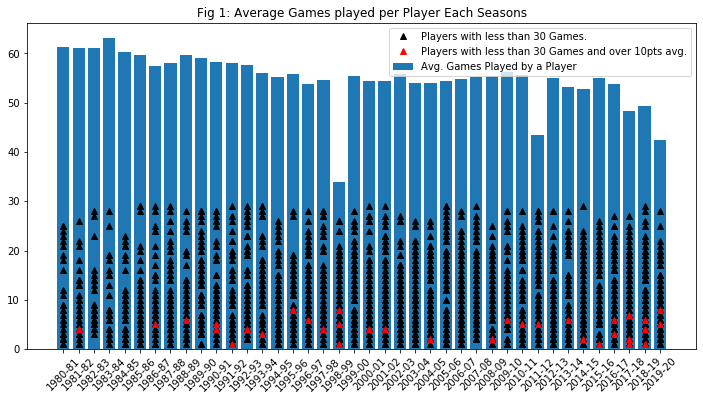

In [16]:
fig,ax_games = plt.subplots(1,1,figsize = (12,6))
ax_games.bar(seasonal_stats["Season"],seasonal_stats["Average Games"], label="Avg. Games Played by a Player")
#sns.barplot(x = "Season", y = "Average Games",data = seasonal_stats,ax = ax_games)
ax_games.plot(lessminutes["Season"],lessminutes["G"],'k^', label = 'Players with less than 30 Games.')
ax_games.plot(outliers_perf["Season"],outliers_perf["G"],'r^', label = 'Players with less than 30 Games and over 10pts avg.')
#sns.swarmplot(x = "Season", y = "G", data = outliers,size = 10, ax = ax_games)
labels = seasonal_stats["Season"].unique().tolist()
ax_games.set_xticklabels(labels, rotation = 45)
ax_games.set_title("Fig 1: Average Games played per Player Each Seasons")
ax_games.legend()
plt.show()

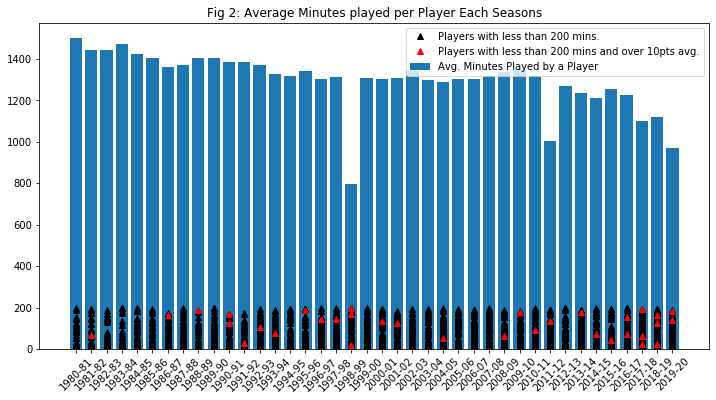

In [17]:
fig,ax_minutes = plt.subplots(1,1,figsize = (12,6))
ax_minutes.bar(seasonal_stats["Season"],seasonal_stats["Average Minutes"], label="Avg. Minutes Played by a Player")
#sns.barplot(x = "Season", y = "Average Games",data = seasonal_stats,ax = ax_games)
ax_minutes.plot(lessminutes["Season"],lessminutes["Total Minutes"],'k^', label = 'Players with less than 200 mins.')
ax_minutes.plot(outliers_perf["Season"],outliers_perf["Total Minutes"],'r^', label = 'Players with less than 200 mins and over 10pts avg.')
#sns.swarmplot(x = "Season", y = "G", data = outliers,size = 10, ax = ax_games)
labels = seasonal_stats["Season"].unique().tolist()
ax_minutes.set_xticklabels(labels, rotation = 45)
ax_minutes.set_title("Fig 2: Average Minutes played per Player Each Seasons")
ax_minutes.legend()
plt.show()


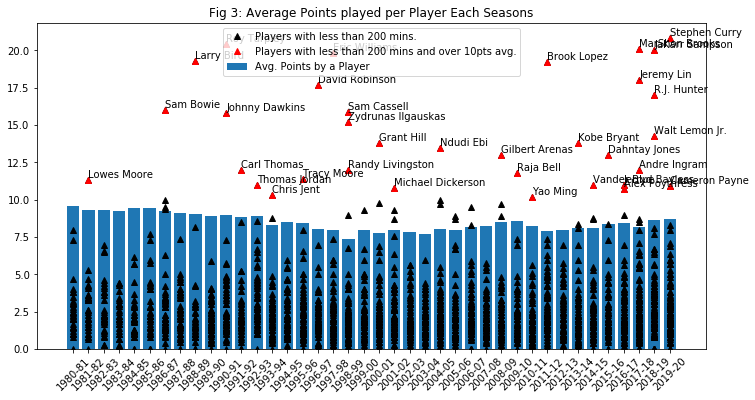

In [18]:
fig,ax_points = plt.subplots(1,1,figsize = (12,6))
ax_points.bar(seasonal_stats["Season"],seasonal_stats["Average Points"], label="Avg. Points by a Player")
#sns.barplot(x = "Season", y = "Average Games",data = seasonal_stats,ax = ax_games)
ax_points.plot(lessminutes["Season"],lessminutes["PTS"],'k^', label = 'Players with less than 200 mins.')
ax_points.plot(outliers_perf["Season"],outliers_perf["PTS"],'r^', label = 'Players with less than 200 mins and over 10pts avg.')
#sns.swarmplot(x = "Season", y = "G", data = outliers,size = 10, ax = ax_games)
labels = seasonal_stats["Season"].unique().tolist()
ax_points.set_xticklabels(labels, rotation = 45)
for (x,y,z) in zip(outliers_perf["Season"], outliers_perf["PTS"],outliers_perf["Name"]):
    ax_points.text(x = x, y = y + 0.15, s = z)
ax_points.set_title("Fig 3: Average Points played per Player Each Seasons")
ax_points.legend()
plt.show()

In [19]:
#percentage of performing outliers in the total set of players having less than 200 mins a season
print("Percentage of performers with less than 200 minutes : {}".format((outliers_perf.shape[0]/nba_data_df.shape[0])*100))
print("Percentage of players with less than 200 minutes : {}".format((lessminutes.shape[0]/nba_data_df.shape[0])*100))

Percentage of performers with less than 200 minutes : 0.20206822774277902
Percentage of players with less than 200 minutes : 15.1254011648639


A Majority of the players with less than 200 minutes in total for a given season, shoot less than the league average. Only 0.2% of players shoot above the league average in such cases. These are anomalies, due to either:
- A player suffered an injury in the opening weeks of the season (E.g. Kobe Bryant, Stephen Curry, Yao Ming, Gilbert Arenas)
- A player who performed in one game and performed bad the rest of the games, hence was sidelined

Hence we remove these **performing** outliers.



In [20]:
idex_performingoutliers = outliers_perf.index.values.tolist()
nba_data_df = nba_data_df.drop(idex_performingoutliers).reset_index(drop = True)

We shall attempt to fill in the missing values of the columns. The following will show a visual representation of the missing values. 


In [21]:
def numberofnan(dataset):
    column_labels = dataset.columns.tolist()[1:-1]
    num_missingvalues = list()
    percentage_missingvalues = list()
    for column in column_labels:
        num_missingvalues.append(dataset[column].isna().sum())
        percentage_missingvalues.append(100*(dataset[column].isna().sum())/dataset[column].shape[0])
    missing_value_percentage_df = pd.DataFrame({'Column Name':column_labels,'Number of Missing values':num_missingvalues,'% of missing values':percentage_missingvalues})
    return missing_value_percentage_df

In [22]:
missing_data_df = numberofnan(nba_data_df)
display(missing_data_df.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,282,1.67937
8,MP,0,0
9,FG,0,0


The above table tells us that the Web Scraping was a success, as the number of missing values is not overwhelming for a dataset that contains data since the 1980 NBA season.

<h3> Filling nan values of FT% </h3>

In [23]:
nba_data_df.loc[nba_data_df["FT%"].isna()].iloc[:,-15:].head(10)

,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
45,0.273,0.281,0.0,0.0,NaN,0.2,0.8,1.0,0.8,0.2,0.0,0.8,0.8,1.8,2005
120,0.429,0.682,0.0,0.0,NaN,0.0,0.5,0.5,0.3,0.3,0.0,1.0,1.0,3.8,2006
136,0.400,0.357,0.0,0.0,NaN,0.0,0.5,0.5,0.3,0.0,0.0,1.3,1.0,2.5,Undrafted
158,0.500,0.625,0.0,0.0,NaN,0.0,0.3,0.3,0.3,0.0,0.0,0.0,1.0,1.7,Undrafted
191,0.500,0.500,0.0,0.0,NaN,0.3,0.5,0.8,0.0,0.1,0.3,0.1,0.1,1.3,Undrafted
205,0.500,0.500,0.0,0.0,NaN,1.0,0.5,1.5,0.0,0.0,0.0,0.5,0.5,1.0,Undrafted
296,0.500,0.500,0.0,0.0,NaN,0.5,0.5,1.0,0.0,0.5,0.5,1.0,2.0,1.0,Undrafted
349,0.333,0.333,0.0,0.0,NaN,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,2.0,Undrafted
419,0.222,0.333,0.0,0.0,NaN,0.1,1.0,1.2,0.6,0.5,0.2,0.3,0.6,1.8,1989
448,0.500,0.357,0.0,0.0,NaN,0.0,3.5,3.5,1.0,0.5,0.0,0.5,0.5,2.5,2008


A First glance at the above data shows that FT% is empty when FT and FTA are 0.0.

In [24]:
print("Total Free Throws: {}".format(nba_data_df.loc[nba_data_df["FT%"].isna()]["FT"].sum()))
print("Total Free Throws Attempts: {}".format(nba_data_df.loc[nba_data_df["FT%"].isna()]["FTA"].sum()))

Total Free Throws: 0.0
Total Free Throws Attempts: 0.0


As per the above analysis, there are no FTA in this data, hence the FT% is NaN. Hence we shall fill this with 0.0 too. 

In [25]:
#fill missing FT%
nba_data_df.loc[nba_data_df["FT%"].isna(),"FT%"] = 0.0
missing_data_df_ftpercent = numberofnan(nba_data_df)
display(missing_data_df_ftpercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,282,1.67937
8,MP,0,0
9,FG,0,0


<h3> Filling in 3P% </h3> 

In [26]:
nba_data_df.loc[nba_data_df["3P%"].isna()].iloc[:,-20:].head(10)

,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
0,0.0,0.0,NaN,1.3,2.7,0.474,0.474,0.6,1.0,0.568,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990
1,0.0,0.0,NaN,2.5,5.1,0.493,0.493,1.1,1.4,0.752,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990
3,0.0,0.0,NaN,1.8,4.2,0.436,0.436,1.2,1.9,0.640,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990
40,0.0,0.0,NaN,0.5,2.3,0.214,0.214,0.7,0.7,1.000,1.0,0.7,1.7,0.7,0.2,0.0,0.2,1.5,1.7,1996
47,0.0,0.0,NaN,1.4,2.6,0.532,0.532,0.9,1.4,0.640,1.3,2.1,3.4,0.5,0.4,0.3,0.7,2.5,3.6,1985
60,0.0,0.0,NaN,6.1,11.6,0.526,0.526,2.7,3.5,0.768,2.1,5.2,7.3,4.6,1.4,0.9,3.0,3.0,14.9,1975
64,0.0,0.0,NaN,5.8,11.2,0.520,0.520,3.0,3.5,0.883,1.9,4.2,6.1,3.8,1.4,0.6,2.4,3.1,14.7,1975
69,0.0,0.0,NaN,0.3,1.1,0.308,0.308,0.3,0.5,0.500,0.1,0.5,0.6,0.1,0.1,0.1,0.3,0.3,0.9,2006
84,0.0,0.0,NaN,1.1,2.3,0.503,0.503,1.0,1.7,0.581,1.8,2.3,4.1,0.5,0.5,0.7,0.9,2.5,3.3,2013
86,0.0,0.0,NaN,3.3,5.3,0.613,0.613,1.4,2.5,0.582,2.7,3.9,6.7,0.8,0.5,1.1,1.1,2.8,8.0,2013


It looks to be the same case as with FT% where if 3P and 3PA are 0.0, 3P% is also empty.

In [27]:
print("Total 3 Pointers : {}".format(nba_data_df.loc[nba_data_df["3P%"].isna()]["3P"].sum()))
print("Total 3 Point Attemptd: {}".format(nba_data_df.loc[nba_data_df["3P%"].isna()]["3PA"].sum()))

Total 3 Pointers : 0.0
Total 3 Point Attemptd: 0.0


As expected, the 3P and 3PA are all zero, hence 3P% too can be made to be 0.0. 

In [28]:
#fill missing 3P%
nba_data_df.loc[nba_data_df["3P%"].isna(),"3P%"] = 0.0
missing_data_df_3ppercent = numberofnan(nba_data_df)
display(missing_data_df_3ppercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,282,1.67937
8,MP,0,0
9,FG,0,0


<h3> Dealing with missing FG% </h3>

In [29]:
nba_data_df.loc[nba_data_df["FG%"].isna()].iloc[:,-25:].head(20)

,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
852,0.0,1.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1990
1188,0.0,1.5,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.5,1.0,1.5,0.0,0.0,0.0,0.5,0.0,0.0,Undrafted
1514,0.0,2.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted
1530,0.0,3.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0,Undrafted
1630,0.0,1.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Undrafted
2378,0.0,3.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted
2536,0.0,6.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,Undrafted
2815,0.0,6.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.8,0.8,0.5,0.3,0.0,0.3,0.3,0.0,2004
3083,0.0,2.5,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.5,0.0,0.0,1.5,1.0,1982
3414,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2007


In [30]:
print("Total Field Goals : {}".format(nba_data_df.loc[nba_data_df["FG%"].isna()]["FG"].sum()))
print("Total Field Goals Attempts: {}".format(nba_data_df.loc[nba_data_df["FG%"].isna()]["FGA"].sum()))
print("Total 2 Pointers : {}".format(nba_data_df.loc[nba_data_df["FG%"].isna()]["2P"].sum()))
print("Total 2 Point Attempts: {}".format(nba_data_df.loc[nba_data_df["FG%"].isna()]["2PA"].sum()))
print("Total 3 Pointers  : {}".format(nba_data_df.loc[nba_data_df["FG%"].isna()]["3P"].sum()))
print("Total 3 Point Attempts: {}".format(nba_data_df.loc[nba_data_df["FG%"].isna()]["3PA"].sum()))

Total Field Goals : 0.0
Total Field Goals Attempts: 0.0
Total 2 Pointers : 0.0
Total 2 Point Attempts: 0.0
Total 3 Pointers  : 0.0
Total 3 Point Attempts: 0.0


Players with no FG% are players who have not attempted any 2 Pointers or 3 Pointers. Hence tthe FG% can also be filled with 0. 

In [31]:
#fill missing FG%
nba_data_df.loc[nba_data_df["FG%"].isna(),"FG%"] = 0.0
missing_data_df_fgpercent = numberofnan(nba_data_df)
display(missing_data_df_fgpercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,282,1.67937
8,MP,0,0
9,FG,0,0


<h3> Filling in 2P%</h3>

In [32]:
nba_data_df.loc[nba_data_df["2P%"].isna()].iloc[:,-20:].head(20)

,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
852,0.0,0.0,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1990
1188,0.0,0.0,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.5,1.0,1.5,0.0,0.0,0.0,0.5,0.0,0.0,Undrafted
1475,0.5,1.0,0.500,0.0,0.0,NaN,0.750,0.5,0.5,1.0,0.0,0.5,0.5,0.5,0.2,0.0,0.2,0.3,2.0,2003
1514,0.0,0.0,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted
1530,0.0,0.0,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,2.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0,Undrafted
1620,0.0,1.0,0.000,0.0,0.0,NaN,0.000,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted
1630,0.0,0.0,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Undrafted
1922,1.0,1.0,1.000,0.0,0.0,NaN,1.500,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,2015
2094,0.0,0.5,0.000,0.0,0.0,NaN,0.000,0.0,0.0,0.0,0.0,0.8,0.8,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted
2378,0.0,0.0,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted


In [33]:
print("Total 2 Pointers : {}".format(nba_data_df.loc[nba_data_df["2P%"].isna()]["2P"].sum()))
print("Total 2 Point Attempts: {}".format(nba_data_df.loc[nba_data_df["2P%"].isna()]["2PA"].sum()))

Total 2 Pointers : 0.0
Total 2 Point Attempts: 0.0


In [34]:
#fill missing 2P%
nba_data_df.loc[nba_data_df["2P%"].isna(),"2P%"] = 0.0
missing_data_df_2ppercent = numberofnan(nba_data_df)
display(missing_data_df_2ppercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,282,1.67937
8,MP,0,0
9,FG,0,0


<h3> Filling in eFG% </h3> 

eFG% is a statistic which adjusts for the fact that a 3 Point Field goal is more worth than a 2 Point Field goal. 

Its equation is (FG + 0.5*3P)/FGA

In [35]:
nba_data_df.loc[nba_data_df["eFG%"].isna(),"eFG%"] = 0.0
missing_data_df_efgpercent = numberofnan(nba_data_df)
display(missing_data_df_efgpercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,282,1.67937
8,MP,0,0
9,FG,0,0


In [36]:
nba_data_df.loc[nba_data_df["GS"].isna()]["Season"].value_counts()

1980-81    282
Name: Season, dtype: int64

It seems that in the 1980-81 season, the Games Started(GS) statistic was not found. To fill this, we can try to find a correlation between the Points Scored and Games Started from other seasons. 

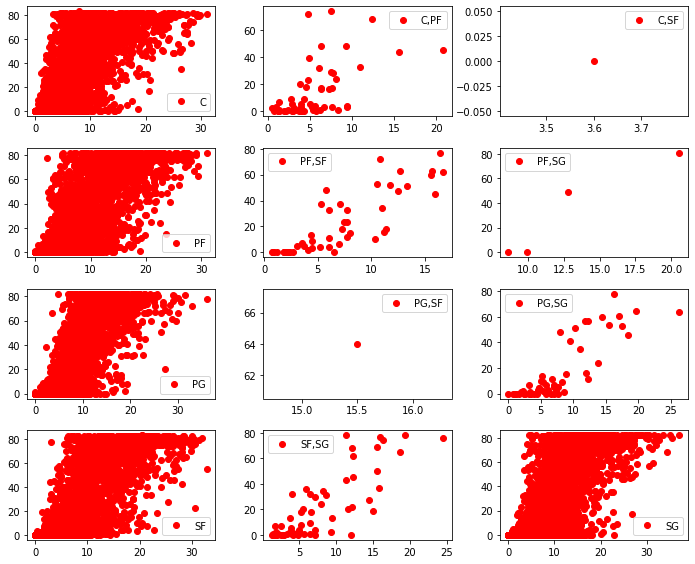

In [37]:
#pts_gs_axes = plt.subplots(1,1,figsize = (12,10))
temp_gs = nba_data_df.groupby('Pos')
key_list_gs = list()
for (key,group) in temp_gs:
    key_list_gs.append(key)

fig,ax = plt.subplots(4,3,figsize = (10,8))
fig.tight_layout()
'''
for key in key_list_gs:
    data = temp_gs.get_group(key)
    ax_gs = gs()
    setattr(ax_gs,'name', sns.scatterplot(x = "PTS",y = "GS",data = data))
    #ax_gs.name.fig.suptitle(key)

'''
i = 0
for row in ax:
    for col in row:
        data = temp_gs.get_group(key_list_gs[i])
        col.plot(data["PTS"],data["GS"],'ro',label = key_list_gs[i])
        col.legend()
        i = i + 1
    



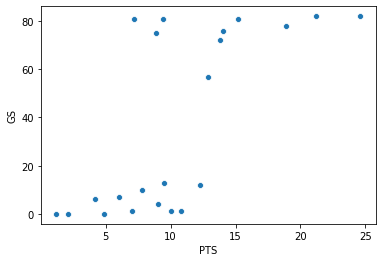

In [38]:
nba_data_df.loc[nba_data_df["Season"] == "1980-81"]["GS"].value_counts(dropna = False)
sns.scatterplot(x = "PTS", y = "GS",data = nba_data_df.loc[(nba_data_df["Season"] == "1980-81") & (~nba_data_df["GS"].isna())])

In [39]:
eighty81season = nba_data_df.loc[(nba_data_df["Season"] == "1980-81") & (~nba_data_df["GS"].isna())]
eighty81season

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
537,102,Tiny Archibald,1980-81,32.0,BOS,NBA,PG,80.0,72.0,35.3,...,0.5,1.8,2.2,7.7,0.9,0.2,3.3,2.5,13.8,1970
1319,239,Larry Bird,1980-81,24.0,BOS,NBA,PF,82.0,82.0,39.5,...,2.3,8.6,10.9,5.5,2.0,0.8,3.5,2.9,21.2,1978
2501,467,M.L. Carr,1980-81,30.0,BOS,NBA,SF,41.0,7.0,16.0,...,0.6,1.4,2.0,1.4,0.7,0.4,1.1,1.8,6.0,1973
2781,507,Maurice Cheeks,1980-81,24.0,PHI,NBA,PG,81.0,81.0,29.8,...,0.8,2.2,3.0,6.9,2.4,0.5,2.1,2.9,9.4,1978
2971,553,Doug Collins,1980-81,29.0,PHI,NBA,SG,12.0,12.0,27.4,...,0.5,1.9,2.4,3.5,0.6,0.3,1.8,1.9,12.3,1973
3370,632,Earl Cureton,1980-81,23.0,PHI,NBA,C,52.0,6.0,10.2,...,1.0,2.0,3.0,0.5,0.4,0.4,0.6,1.3,4.2,1979
3729,685,Darryl Dawkins,1980-81,24.0,PHI,NBA,C,76.0,76.0,27.5,...,1.4,5.8,7.2,1.4,0.5,1.5,2.9,4.2,14.0,1975
4203,773,Terry Duerod,1980-81,24.0,TOT,NBA,"SF,SG",50.0,0.0,9.0,...,0.3,0.5,0.9,0.7,0.3,0.1,0.7,0.5,4.9,1979
4609,847,Julius Erving,1980-81,30.0,PHI,NBA,SF,82.0,82.0,35.0,...,3.0,5.0,8.0,4.4,2.1,1.8,3.2,2.8,24.6,1972
4789,885,Eric Fernsten,1980-81,27.0,BOS,NBA,C,45.0,0.0,6.2,...,0.6,0.7,1.4,0.2,0.1,0.2,0.4,0.6,2.1,1975


In [40]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
col_list = eighty81season.columns.tolist()
col_list.remove('PlayerID')
col_list.remove('Season')
col_list.remove('Name')
col_list.remove('Lg')
col_list.remove('Tm')
col_list.remove('Draft Year')
col_list.remove('FG%')
col_list.remove('3P%')
col_list.remove('2P%')
col_list.remove('eFG%')
col_list.remove('FT%')
#investigate which features are the best
workingsetGS = eighty81season[col_list]
GSvals = workingsetGS["GS"]
col_list.remove("GS")
featureset = workingsetGS[col_list]
#GSvals = eighty81season["GS"]







In [41]:
featureset.loc[(featureset["Pos"] == "SF,SG"),"Pos"] = "SG"
featureset

,Age,Pos,G,MP,FG,FGA,3P,3PA,2P,2PA,...,FTA,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
537,32.0,PG,80.0,35.3,4.8,9.6,0.0,0.1,4.8,9.5,...,5.2,0.5,1.8,2.2,7.7,0.9,0.2,3.3,2.5,13.8
1319,24.0,PF,82.0,39.5,8.8,18.3,0.2,0.9,8.5,17.4,...,4.0,2.3,8.6,10.9,5.5,2.0,0.8,3.5,2.9,21.2
2501,30.0,SF,41.0,16.0,2.4,5.3,0.0,0.3,2.3,4.9,...,1.6,0.6,1.4,2.0,1.4,0.7,0.4,1.1,1.8,6.0
2781,24.0,PG,81.0,29.8,3.8,7.2,0.0,0.1,3.8,7.1,...,2.2,0.8,2.2,3.0,6.9,2.4,0.5,2.1,2.9,9.4
2971,29.0,SG,12.0,27.4,5.2,10.5,0.0,0.0,5.2,10.5,...,2.4,0.5,1.9,2.4,3.5,0.6,0.3,1.8,1.9,12.3
3370,23.0,C,52.0,10.2,1.8,3.9,0.0,0.0,1.8,3.9,...,1.2,1.0,2.0,3.0,0.5,0.4,0.4,0.6,1.3,4.2
3729,24.0,C,76.0,27.5,5.6,9.2,0.0,0.0,5.6,9.2,...,4.0,1.4,5.8,7.2,1.4,0.5,1.5,2.9,4.2,14.0
4203,24.0,SG,50.0,9.0,2.1,4.7,0.2,0.3,1.9,4.4,...,0.8,0.3,0.5,0.9,0.7,0.3,0.1,0.7,0.5,4.9
4609,30.0,SF,82.0,35.0,9.7,18.6,0.0,0.2,9.6,18.4,...,6.5,3.0,5.0,8.0,4.4,2.1,1.8,3.2,2.8,24.6
4789,27.0,C,45.0,6.2,0.8,1.8,0.0,0.0,0.8,1.8,...,0.7,0.6,0.7,1.4,0.2,0.1,0.2,0.4,0.6,2.1


In [42]:
from sklearn.base import TransformerMixin,BaseEstimator
from sklearn.preprocessing import StandardScaler
class separateattributes(BaseEstimator,TransformerMixin):
    def __init__(self,attributes):
        
        self.attributes = attributes
    def fit(self,X,y=None):
        return self
    def transform(self,X):
        return X[self.attributes]
        
class onehotencodeddataframe(BaseEstimator,TransformerMixin):
    def __init__(self,attributes):
        self.attributes = attributes
    def fit(self,X):
        return self
    def transform(self,X):
        for attrib in self.attributes:
            X = pd.get_dummies(X,columns = [attrib])
        return X
class scalerdataframe(BaseEstimator, TransformerMixin):
    def __init__(self):
        return None
    def fit(self,data):
        return self
    def transform(self,dataset):
        scl = StandardScaler()
        scaleddf = pd.DataFrame(scl.fit_transform(dataset.values),columns = dataset.columns, index = dataset.index)
        return scaleddf

In [43]:
cat_attribs = ["Pos"]
num_attribs = featureset.columns.tolist()
num_attribs.remove("Pos")

In [44]:
from sklearn.pipeline import Pipeline
num_pipeline = Pipeline([
    ('get_num_attribs',separateattributes(num_attribs)),
    ('scale_num_data', scalerdataframe()),
    ])
cat_pipeline = Pipeline([
    ('get_cat_attribs',separateattributes(cat_attribs)),
    ('encode_cat_data',onehotencodeddataframe(cat_attribs)),
])

In [45]:
num_features = num_pipeline.fit_transform(featureset)
cat_features = cat_pipeline.fit_transform(featureset)

In [46]:
final_eighty81season = pd.concat([num_features,cat_features],axis = 1)
final_eighty81season.head()

,Age,G,MP,FG,FGA,3P,3PA,2P,2PA,FT,...,STL,BLK,TOV,PF,PTS,Pos_C,Pos_PF,Pos_PG,Pos_SF,Pos_SG
537,1.682746,0.567517,1.220706,0.264707,0.289467,-0.415581,-0.286299,0.291548,0.318830,1.689108,...,0.044992,-0.634949,1.562761,0.164722,0.575950,0,0,1,0,0
1319,-0.806021,0.665059,1.646341,2.016149,2.341467,1.616150,2.233134,1.928235,2.216522,1.089747,...,1.859675,0.203184,1.781051,0.567376,1.865698,0,1,0,0,0
2501,1.060554,-1.334552,-0.735188,-0.786159,-0.724740,-0.415581,0.343559,-0.814322,-0.786156,-0.558496,...,-0.284950,-0.355572,-0.838434,-0.539923,-0.783514,0,0,0,1,0
2781,-0.806021,0.616288,0.663327,-0.173154,-0.276602,-0.415581,-0.286299,-0.150800,-0.257684,-0.258815,...,2.519559,-0.215883,0.253018,0.567376,-0.190927,0,0,1,0,0
2971,0.749458,-2.748912,0.420107,0.439851,0.501743,-0.415581,-0.601228,0.468487,0.559044,-0.034055,...,-0.449921,-0.495261,-0.074417,-0.439259,0.314515,0,0,0,0,1


Using a simple RandomForest Regressor to train the data to predict the number of games started. As this is only to fill some missing values, we arent very concerned with accuracy

In [47]:
from sklearn.ensemble import RandomForestRegressor
rand_regressor = RandomForestRegressor(n_estimators = 500, criterion= 'mse',max_depth = 10, max_leaf_nodes=16, bootstrap= True)

In [48]:
rand_regressor.fit(final_eighty81season,GSvals)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=10,
                      max_features='auto', max_leaf_nodes=16,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=500,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [49]:
for (attrib,imp) in zip(final_eighty81season.columns.tolist(),rand_regressor.feature_importances_):
    print('{}:{}'.format(attrib,imp))


Age:0.0024027436508510637
G:0.003882010127875805
MP:0.5944493530382563
FG:0.019285690770113047
FGA:0.02573232203765618
3P:0.0014224179524964927
3PA:0.007549420753123547
2P:0.0011221780118625267
2PA:0.0071794584429151894
FT:0.012931082616496328
FTA:0.010253097815992674
ORB:0.004923403439597717
DRB:0.0066964437454477945
TRB:0.01110036688299635
AST:0.0027470402056759403
STL:0.010291602852955405
BLK:0.004346731099070252
TOV:0.10672226732028814
PF:0.14376426787424845
PTS:0.022515199672793994
Pos_C:0.00015029793073167725
Pos_PF:7.68454071744045e-06
Pos_PG:0.00018256229738892253
Pos_SF:1.587981853585124e-05
Pos_SG:0.0003264771019129844


In [50]:
gs_pred = rand_regressor.predict(final_eighty81season)
np.ceil(gs_pred)

array([64., 81.,  6., 72., 29.,  5., 67.,  2., 81.,  2., 61., 12., 26.,
       75.,  2., 81., 13.,  7., 76.,  2.,  9., 44.])

It is not very accurate, however we can still use this to fill in some missing values.

In [51]:
nba_data_df.loc[nba_data_df["eFG%"].isna(),"eFG%"] = 0.0
missing_data_df_efgpercent = numberofnan(nba_data_df)
display(missing_data_df_efgpercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,282,1.67937
8,MP,0,0
9,FG,0,0


In [52]:
nba_data_df.loc[nba_data_df["GS"].isna()]
num_features_pred = num_pipeline.fit_transform(nba_data_df.loc[nba_data_df["GS"].isna()])
cat_features_pred = cat_pipeline.fit_transform(nba_data_df.loc[nba_data_df["GS"].isna()])

In [53]:
final_eighty81season_pred = pd.concat([num_features_pred,cat_features_pred],axis = 1)
final_eighty81season_pred.head()

,Age,G,MP,FG,FGA,3P,3PA,2P,2PA,FT,...,STL,BLK,TOV,PF,PTS,Pos_C,Pos_PF,Pos_PG,Pos_SF,Pos_SG
5,2.227605,0.770994,1.614025,2.742138,2.166650,-0.326435,-0.494746,2.775757,2.243101,2.297353,...,-0.219639,4.490800,1.671602,0.813304,2.683805,1,0,0,0,0
41,0.042072,-0.864344,-1.488400,-1.294083,-1.356092,-0.326435,-0.494746,-1.283411,-1.338286,-1.100956,...,-1.193508,-0.655696,-1.736616,-1.524851,-1.273197,0,0,0,1,0
60,0.042072,0.571562,0.586871,0.948262,0.774429,-0.326435,-0.494746,0.971682,0.827703,0.530233,...,1.143778,0.814732,1.554077,0.707024,0.866157,1,0,0,0,0
278,-1.206804,-1.542411,-0.974823,-1.131004,-1.039678,-0.326435,-0.494746,-1.119405,-1.016605,-0.897057,...,-1.193508,-0.104286,-0.796418,-0.036934,-1.096258,0,1,0,0,0
709,1.915386,-0.545254,-0.932898,-1.171774,-1.250620,-0.326435,-0.494746,-1.160406,-1.231059,-1.100956,...,-0.998734,-0.471893,-1.148992,-0.568333,-1.176685,1,0,0,0,0


In [54]:
missing_GS_vals = np.ceil(rand_regressor.predict(final_eighty81season_pred))
missing_GS_vals

array([80.,  1., 78.,  5.,  3., 79., 64., 79., 32.,  6., 78., 10., 68.,
        3., 23.,  6., 26., 63.,  5.,  9., 69., 26.,  3., 78., 38.,  3.,
        5., 77., 76.,  6., 10.,  5.,  3.,  2., 80., 78.,  4.,  2., 79.,
       22.,  3., 76.,  3., 38., 32., 69., 72., 16., 27., 47.,  4., 13.,
       19., 80., 71., 67.,  4.,  5., 66.,  3.,  6.,  5.,  2., 15., 77.,
       19., 23., 24.,  6.,  3., 78., 10.,  7., 81.,  5.,  2., 72., 74.,
        7.,  6., 14.,  4., 75., 78.,  6., 66.,  9., 62., 80., 65., 21.,
       76., 30.,  8.,  3.,  7.,  3., 14.,  3.,  7., 78., 79., 13., 12.,
       64., 36., 35., 27.,  3., 28., 79.,  5., 63., 73.,  5.,  9., 10.,
       80., 66., 25., 37., 66.,  3., 77., 77., 56.,  3., 27., 69., 43.,
       10., 20.,  3., 16.,  2.,  6., 15., 34., 71., 66.,  2., 80., 80.,
       67.,  3., 12., 33., 79., 70., 69.,  2.,  5., 73.,  3., 21., 32.,
        3., 73., 75., 59., 78., 43., 10., 11., 80., 72.,  5.,  1., 23.,
        2.,  2.,  4., 75., 44.,  5.,  2., 25.,  3., 71., 33., 64

In [55]:
nba_data_df.loc[nba_data_df["GS"].isna(),"GS"] = missing_GS_vals

In [56]:
missing_data_df_gs = numberofnan(nba_data_df)
display(missing_data_df_gs.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,0,0
8,MP,0,0
9,FG,0,0


In [57]:
#as the model trained to predict GS has in some cases predicted a GA value higher than the G value, we cap it at G - 2 in such cases
nba_data_df.loc[(nba_data_df["Season"] == "1980-81") & (nba_data_df["GS"] > nba_data_df["G"]), "GS"] = nba_data_df.loc[(nba_data_df["Season"] == "1980-81") & (nba_data_df["GS"] > nba_data_df["G"])]["G"] - 2


In [58]:
display(numberofnan(nba_data_df).style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,0,0
8,MP,0,0
9,FG,0,0


<h3> Now all the missing data has been filled </h3>

Another set of outliers arise when players who barely attempt any 3 Pointers, 2 Pointers or FG, manage to get their **few** attempts to go in, causing their 3P%, 2P%, FG% to be equal to 1.0. The following analysis intends to analyse this further. 

Analysis 3 Pointers

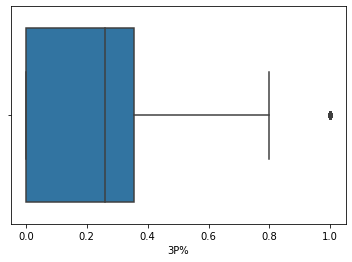

In [59]:
sns.boxplot(x = nba_data_df["3P%"])

In [60]:
#(75th percentile + 1.5*IQR
max_with_iqr = nba_data_df["3P%"].describe()["75%"] + 1.5*(nba_data_df["3P%"].describe()["75%"] - nba_data_df["3P%"].describe()["25%"])
max_with_iqr

0.8849999999999999

In [61]:
#players with 3P% greater than the maximum as per the above box plot
print("Average 3PA of players with  3P% greater than 0.88 : {}". format(nba_data_df[["3PA","3P%"]].loc[nba_data_df["3P%"] > max_with_iqr]["3PA"].mean()))
print("Average 3P% of players with  3P% greater than 0.88 : {}". format(nba_data_df[["3PA","3P%"]].loc[nba_data_df["3P%"] > max_with_iqr]["3P%"].mean()))
print("Average 3PA of entire NBA : {}".format(nba_data_df["3PA"].mean()))
print("Average 3P% of entire NBA : {}".format(nba_data_df["3P%"].mean()))

Average 3PA of players with  3P% greater than 0.88 : 0.11666666666666663
Average 3P% of players with  3P% greater than 0.88 : 1.0
Average 3PA of entire NBA : 1.265525250119093
Average 3P% of entire NBA : 0.21546456646022


From the above, the players who have a 3P% greater than the "Maximum" as per the boxplot, have less than average values when it comes to their 3PA. Hence this shows that 3P% is not a good statistic to rely on. In fact all % based features (3P%,2P%) tend to be misleading and are not advisable to be kept in data analysis as they are linearly dependent of other features.

Furthermore all FG,FGA,FG% and eFG% are linearly dependent of other variables. 

Hence these values will be dropped. 

In [62]:
nba_data_df_v2 = nba_data_df.drop(["3P%","2P%","FG%","FG","FGA","eFG%","FT%","TRB"],axis = 1)
nba_data_df_v2.head()

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,FTA,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,1.0,0.6,1.4,0.3,0.1,0.3,0.5,0.9,3.1,1990
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,1.4,1.1,2.5,0.4,0.4,0.2,0.9,1.9,6.1,1990
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.5,1.7,2.8,0.4,0.3,0.3,1.3,2.5,7.7,1990
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,1.9,0.9,2.6,0.2,0.2,0.2,1.3,1.5,4.9,1990
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.6,0.7,1.4,0.2,0.3,0.2,0.8,1.9,4.7,1990


<h2> Predicting the Most Improved Player </h2> 

In [63]:
most_improved_player = pd.read_csv('Most_Improved_Player.csv')
most_improved_player.dropna(axis = 0, inplace = True)
most_improved_player

,Season,Lg,Player
0,2019-20,NBA,Brandon Ingram
1,2018-19,NBA,Pascal Siakam
2,2017-18,NBA,Victor Oladipo
3,2016-17,NBA,Giannis Antetokounmpo
4,2015-16,NBA,CJ McCollum
5,2014-15,NBA,Jimmy Butler
6,2013-14,NBA,Goran Dragić
7,2012-13,NBA,Paul George
8,2011-12,NBA,Ryan Anderson
9,2010-11,NBA,Kevin Love


The Most Improved Player Award was only given out after 1985-86, hence the dataset has to be from 1985-1986 only

In [64]:
prior_seasons = ["1980-81","1981-82","1982-83","1983-84"]
mip_nba_df = nba_data_df_v2.drop(nba_data_df_v2.loc[nba_data_df_v2["Season"].apply(lambda x:x in prior_seasons)].index.values.tolist())
mip_nba_df.head(40)

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,FTA,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,1.0,0.6,1.4,0.3,0.1,0.3,0.5,0.9,3.1,1990
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,1.4,1.1,2.5,0.4,0.4,0.2,0.9,1.9,6.1,1990
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.5,1.7,2.8,0.4,0.3,0.3,1.3,2.5,7.7,1990
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,1.9,0.9,2.6,0.2,0.2,0.2,1.3,1.5,4.9,1990
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.6,0.7,1.4,0.2,0.3,0.2,0.8,1.9,4.7,1990
9,2,Kareem Abdul-Jabbar,1984-85,37.0,LAL,NBA,C,79.0,79.0,33.3,...,5.0,2.1,5.8,3.2,0.8,2.1,2.5,3.0,22.0,1969
10,2,Kareem Abdul-Jabbar,1985-86,38.0,LAL,NBA,C,79.0,79.0,33.3,...,5.6,1.7,4.4,3.5,0.8,1.6,2.6,3.1,23.4,1969
11,2,Kareem Abdul-Jabbar,1986-87,39.0,LAL,NBA,C,78.0,78.0,31.3,...,4.4,1.9,4.8,2.6,0.6,1.2,2.4,3.1,17.5,1969
12,2,Kareem Abdul-Jabbar,1987-88,40.0,LAL,NBA,C,80.0,80.0,28.9,...,3.4,1.5,4.5,1.7,0.6,1.2,2.0,2.7,14.6,1969
13,2,Kareem Abdul-Jabbar,1988-89,41.0,LAL,NBA,C,74.0,74.0,22.9,...,2.2,1.4,3.1,1.0,0.5,1.1,1.3,2.6,10.1,1969


In [65]:
mip_nba_df["MIP"] = np.nan
for (season,player) in zip(most_improved_player["Season"],most_improved_player["Player"]):
    mip_nba_df.loc[(mip_nba_df["Season"] == season) & (mip_nba_df["Name"] == player),"MIP"] = int(1)
mip_nba_df.loc[mip_nba_df["MIP"] != int(1),"MIP"] = int(0)

In [66]:
mip_nba_df["MIP"] = mip_nba_df["MIP"].astype(int)

In [67]:
mip_nba_df

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,MIP
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,0.6,1.4,0.3,0.1,0.3,0.5,0.9,3.1,1990,0
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,1.1,2.5,0.4,0.4,0.2,0.9,1.9,6.1,1990,0
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.7,2.8,0.4,0.3,0.3,1.3,2.5,7.7,1990,0
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.9,2.6,0.2,0.2,0.2,1.3,1.5,4.9,1990,0
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.7,1.4,0.2,0.3,0.2,0.8,1.9,4.7,1990,0
9,2,Kareem Abdul-Jabbar,1984-85,37.0,LAL,NBA,C,79.0,79.0,33.3,...,2.1,5.8,3.2,0.8,2.1,2.5,3.0,22.0,1969,0
10,2,Kareem Abdul-Jabbar,1985-86,38.0,LAL,NBA,C,79.0,79.0,33.3,...,1.7,4.4,3.5,0.8,1.6,2.6,3.1,23.4,1969,0
11,2,Kareem Abdul-Jabbar,1986-87,39.0,LAL,NBA,C,78.0,78.0,31.3,...,1.9,4.8,2.6,0.6,1.2,2.4,3.1,17.5,1969,0
12,2,Kareem Abdul-Jabbar,1987-88,40.0,LAL,NBA,C,80.0,80.0,28.9,...,1.5,4.5,1.7,0.6,1.2,2.0,2.7,14.6,1969,0
13,2,Kareem Abdul-Jabbar,1988-89,41.0,LAL,NBA,C,74.0,74.0,22.9,...,1.4,3.1,1.0,0.5,1.1,1.3,2.6,10.1,1969,0


In [75]:
delta_groups = mip_nba_df.groupby("Name")
delta_key_list = list()

for key,groups in delta_groups:
    delta_key_list.append(key)

delta_features = ["3P","3PA","2P","2PA","FT","FTA","ORB","DRB","AST","STL","BLK","TOV","PF","PTS"]
non_delta_features = [i for i in delta_groups.get_group(delta_key_list[0]).columns.tolist() if i not in delta_features]
non_delta_features.remove("MIP")

i = 0
season_change_df = None
for key in delta_key_list:
    temp = delta_groups.get_group(key)
    player_change = pd.concat([temp.iloc[1:][non_delta_features],temp[delta_features].diff().iloc[1:],temp.iloc[1:]["MIP"]],axis = 1)
    if i != 0:
        season_change_df = pd.concat([season_change_df,player_change],axis = 0)
    else:
        season_change_df = player_change
        i = 1

In [83]:
season_change_df.sort_values(by=["PlayerID","Season"],inplace = True)
season_change_df

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,FTA,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,MIP
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,0.4,0.5,1.1,0.1,0.3,-0.1,0.4,1.0,3.0,0
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,0.1,0.6,0.3,0.0,-0.1,0.1,0.4,0.6,1.6,0
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.4,-0.8,-0.2,-0.2,-0.1,-0.1,0.0,-1.0,-2.8,0
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,-1.3,-0.2,-1.2,0.0,0.1,0.0,-0.5,0.4,-0.2,0
10,2,Kareem Abdul-Jabbar,1985-86,38.0,LAL,NBA,C,79.0,79.0,33.3,...,0.6,-0.4,-1.4,0.3,0.0,-0.5,0.1,0.1,1.4,0
11,2,Kareem Abdul-Jabbar,1986-87,39.0,LAL,NBA,C,78.0,78.0,31.3,...,-1.2,0.2,0.4,-0.9,-0.2,-0.4,-0.2,0.0,-5.9,0
12,2,Kareem Abdul-Jabbar,1987-88,40.0,LAL,NBA,C,80.0,80.0,28.9,...,-1.0,-0.4,-0.3,-0.9,0.0,0.0,-0.4,-0.4,-2.9,0
13,2,Kareem Abdul-Jabbar,1988-89,41.0,LAL,NBA,C,74.0,74.0,22.9,...,-1.2,-0.1,-1.4,-0.7,-0.1,-0.1,-0.7,-0.1,-4.5,0
15,3,Mahmoud Abdul-Rauf,1991-92,22.0,DEN,NBA,PG,81.0,11.0,19.0,...,-0.2,-0.2,-0.2,-0.7,-0.3,-0.1,-0.2,-0.6,-3.8,0
16,3,Mahmoud Abdul-Rauf,1992-93,23.0,DEN,NBA,PG,81.0,81.0,33.5,...,1.6,0.3,1.0,1.8,0.5,0.1,0.9,0.6,8.9,1


In [102]:
season_change_df.columns.tolist()

['PlayerID',
 'Name',
 'Season',
 'Age',
 'Tm',
 'Lg',
 'Pos',
 'G',
 'GS',
 'MP',
 'Draft Year',
 '3P',
 '3PA',
 '2P',
 '2PA',
 'FT',
 'FTA',
 'ORB',
 'DRB',
 'AST',
 'STL',
 'BLK',
 'TOV',
 'PF',
 'PTS',
 'MIP']

<h3> Average year by year Statistical Change of a Most Improved Player </h3>

In [88]:
season_change_df.loc[season_change_df["MIP"] == 1][delta_features].mean(axis = 0)

3P     0.405714
3PA    0.914286
2P     2.557143
2PA    4.740000
FT     1.791429
FTA    2.085714
ORB    0.440000
DRB    1.537143
AST    1.560000
STL    0.348571
BLK    0.137143
TOV    0.948571
PF     0.434286
PTS    8.122857
dtype: float64

<h3> Average year by year Statistical Change of a player who wasn't voted Most Improved Player </h3>

In [89]:
season_change_df.loc[season_change_df["MIP"] != 1][delta_features].mean()

3P     0.022304
3PA    0.062617
2P    -0.128379
2PA   -0.262331
FT    -0.065444
FTA   -0.093719
ORB   -0.049833
DRB   -0.037994
AST   -0.037288
STL   -0.021518
BLK   -0.019096
TOV   -0.049000
PF    -0.051461
PTS   -0.255669
dtype: float64

There is an evident different in the average seasonal change of statistics each year, between a player who was voted Most Improved Player and someone who wasnt. 

<h3> Visualizing the data using t-Stochastic Distributed Neighbor Embedding </h3>

Given the large number of dimensions in this dataset, it would be convenient to be able to visualize the large dataset and it's dimensions while preserving 

In [107]:
from sklearn.manifold import TSNE
delta_features = ["3P","3PA","2P","2PA","FT","FTA","ORB","DRB","AST","STL","BLK","TOV","PF","PTS"]
delta_features.insert(0,"Age")
data_to_fit = season_change_df[delta_features]
data_to_fit

tsne = TSNE(n_components = 2, random_state= 42)
X_reduced = tsne.fit_transform(data_to_fit)

In [111]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import matplotlib as mpl
def plot_class(X,y):
    X_normalized = MinMaxScaler().fit_transform(X)
    classes = np.unique(y)
    fig,ax = plt.subplots(1,1,figsize = (13,10))
    #cmap = mpl.cm.get_cmap('jet')
    col = ['b^','rs']
    for class_name in classes:
        ax.plot(X_normalized[y == class_name,0],X_normalized[y == class_name,1],col[int(class_name)])


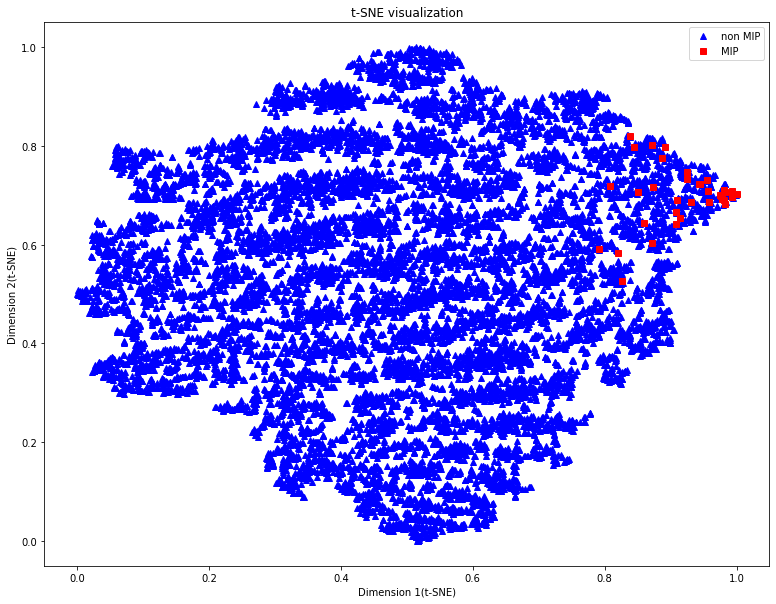

In [129]:

X_normalized = MinMaxScaler().fit_transform(X_reduced)
fig,ax = plt.subplots(1,1,figsize = (13,10))
ax.plot(X_normalized[season_change_df["MIP"] == 0,0],X_normalized[season_change_df["MIP"] == 0,1],'b^', label = "non MIP")
ax.plot(X_normalized[season_change_df["MIP"] == 1,0],X_normalized[season_change_df["MIP"] == 1,1],'rs', label = "MIP")
ax.set_xlabel('Dimension 1(t-SNE)')
ax.set_ylabel('Dimension 2(t-SNE)')
ax.set_title('t-SNE visualization')
ax.legend()
plt.show()



The t-Stochastic Neighbor Embedding tries to reduce dimensionality while trying to keep similar instances close by and other dissimilar instances further apart. The above figure shows that all NBA players who won the Most Improved Player award tend to be isolated towards the top right of the figure. However there is still overlap with other players, which can affect the prediction algorithm.

In [130]:
#trying a 3 Dimensions using t-stochastic neighbor embedding with 3 dimensions

tsne = TSNE(n_components = 3, random_state= 42)
X_reduced = tsne.fit_transform(data_to_fit)

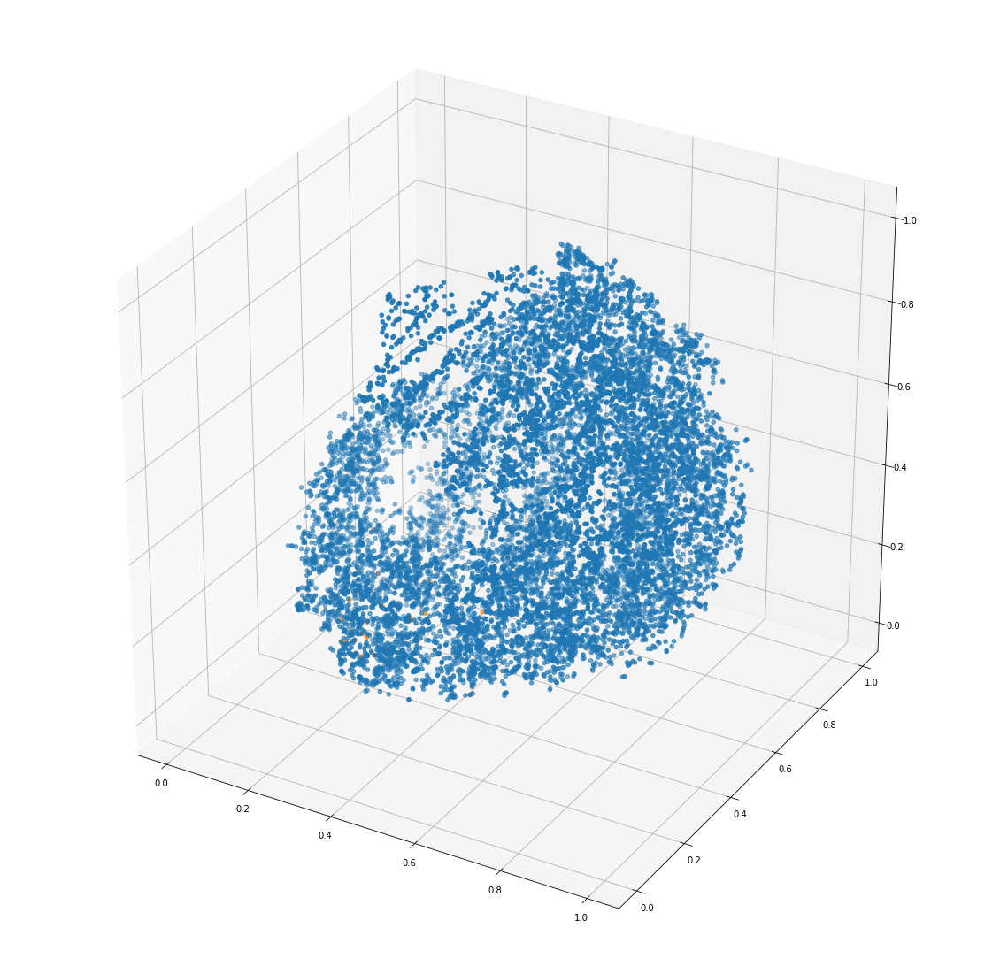

In [144]:
%matplotlib inline
X_normalized_3d = MinMaxScaler().fit_transform(X_reduced)
from mpl_toolkits.mplot3d import Axes3D
fig3d = plt.figure(figsize = (20,20))
ax3d = fig3d.add_subplot(1,1,1,projection = '3d')
ax3d.scatter(X_normalized_3d[season_change_df["MIP"] == 0,0],X_normalized_3d[season_change_df["MIP"] == 0,1],X_normalized_3d[season_change_df["MIP"] == 0,2],'b^',label = "non-MIP")
ax3d.scatter(X_normalized_3d[season_change_df["MIP"] == 1,0],X_normalized_3d[season_change_df["MIP"] == 1,1],X_normalized_3d[season_change_df["MIP"] == 1,2],'rs',label = "MIP")

Using a 3D visualization causes no improvement in the visualization

In [145]:
xreduced_df = pd.DataFrame(data = X_normalized, columns = ["Dim1","Dim2"])
xreduced_df.to_csv('2DMIP.csv',index = False)

In [146]:
delta_features

['Age',
 '3P',
 '3PA',
 '2P',
 '2PA',
 'FT',
 'FTA',
 'ORB',
 'DRB',
 'AST',
 'STL',
 'BLK',
 'TOV',
 'PF',
 'PTS']

As seen in the 2D t-Stochastic Neighbor Embedding visualization, all Most Improved Players occur within t-SNE dimension 1> 0.75 and t-SNE dimension2>0.5 and <0.9. As there is a lot of overlap if compared with the entire dataset, lets try to apply t-SNE on the instances which occur in this region only. 

In [147]:
ind = np.where((X_normalized[:,0] > 0.75) & ((X_normalized[:,1] > 0.5) & (X_normalized[:,1] < 0.9)))

In [153]:
data_to_fit.iloc[ind[0],:][delta_features].mean(axis = 0)

Age    24.847458
3P      0.345836
3PA     0.881135
2P      1.657627
2PA     3.215696
FT      1.090641
FTA     1.340383
ORB     0.409211
DRB     1.225203
AST     1.000368
STL     0.291746
BLK     0.151879
TOV     0.589167
PF      0.594768
PTS     5.450258
dtype: float64

In [154]:
tsne_3 = TSNE(n_components=3,random_state=42)
X_reduced_3 = tsne_3.fit_transform(data_to_fit.iloc[ind[0],:])

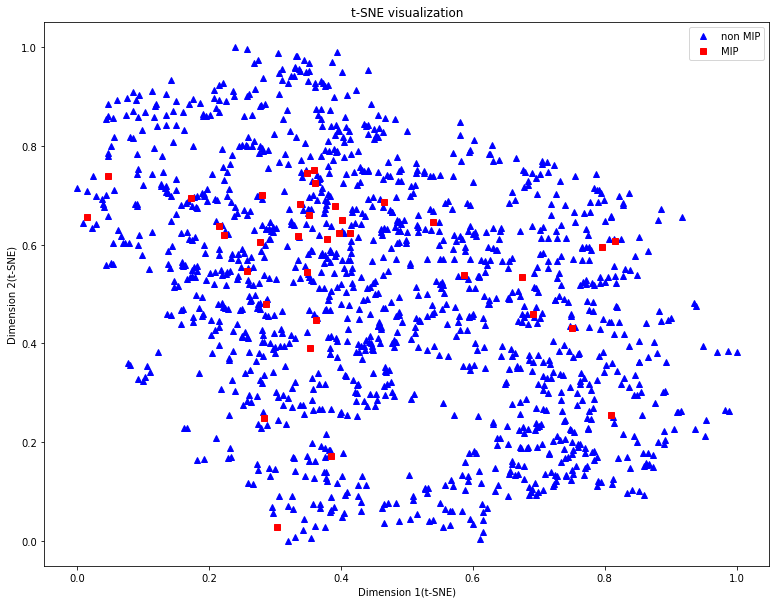

In [157]:

X_normalized_3 = MinMaxScaler().fit_transform(X_reduced_3)
fig_3,ax_3 = plt.subplots(1,1,figsize = (13,10))
ax_3.plot(X_normalized_3[season_change_df.iloc[ind[0],:]["MIP"] == 0,0],X_normalized_3[season_change_df.iloc[ind[0],:]["MIP"] == 0,1],'b^', label = "non MIP")
ax_3.plot(X_normalized_3[season_change_df.iloc[ind[0],:]["MIP"] == 1,0],X_normalized_3[season_change_df.iloc[ind[0],:]["MIP"] == 1,1],'rs', label = "MIP")
ax_3.set_xlabel('Dimension 1(t-SNE)')
ax_3.set_ylabel('Dimension 2(t-SNE)')
ax_3.set_title('t-SNE visualization')
ax_3.legend()
plt.show()

The above figure too has significant overlap, which prevents us from getting a sufficient visualization

<h3> Investigating the impact of age on winning the Most Improved Player Award </h3>

Text(0.5, 1.0, 'Age vs. Most Improved Player Award')

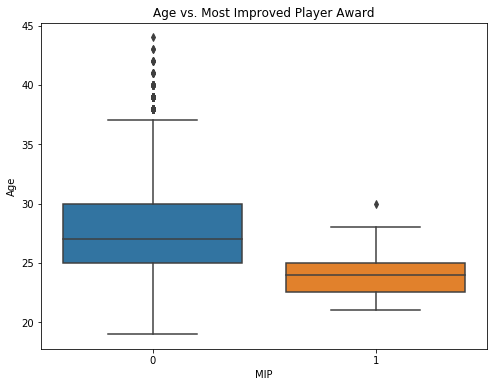

In [159]:
ax_age1 = plt.figure(figsize = (8,6)).add_subplot(111)
sns.boxplot(x = season_change_df["MIP"], y = season_change_df["Age"], ax = ax_age1)
ax_age1.set_title("Age vs. Most Improved Player Award")

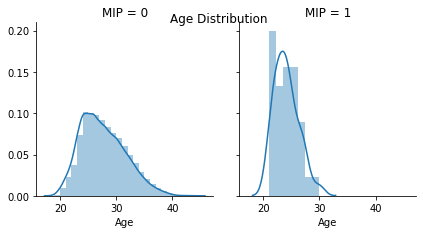

In [183]:
age_grid = sns.FacetGrid(season_change_df, col = "MIP")
age_grid_1 = age_grid.facet_axis(0,0)
age_grid_2 = age_grid.facet_axis(0,1)
sns.distplot(season_change_df.loc[season_change_df["MIP"] == 0]['Age'], ax = age_grid_1, bins = 25)
sns.distplot(season_change_df.loc[season_change_df["MIP"] == 1]['Age'], ax = age_grid_2, bins = 7)
age_grid_1.set_title('MIP = 0')
age_grid_2.set_title('MIP = 1')
age_grid.fig.suptitle("Age Distribution")
age_grid.fig.subplots_adjust(hspace = 0.9,wspace = 0.15)
plt.show()

In [192]:
#investigate if the ages of players who won MIP are significantly different with players who didnt win MIP
#significance level is 95% and alpha is 0.05
#value says that the null hypothesis is that the value between the means is equal to 0
#https://towardsdatascience.com/hypothesis-testing-in-machine-learning-using-python-a0dc89e169ce
from scipy import stats
from statsmodels.stats import weightstats as stests
ztest,pval = stests.ztest(season_change_df.loc[season_change_df["MIP"] == 0]['Age'],season_change_df.loc[season_change_df["MIP"] == 1]['Age'],value = 0, alternative='two-sided')
pval

1.7485984086549432e-07

There is a significant statistical difference between the mean age of players who won Most Improved Player and those that did not. 

<h3> Investigating the impact of an year to year improvement in 3P made, with respect to winning MIP </h3>

Text(0.5, 1, 'Y2Y improvement in 3P made  vs. Most Improved Player Award')

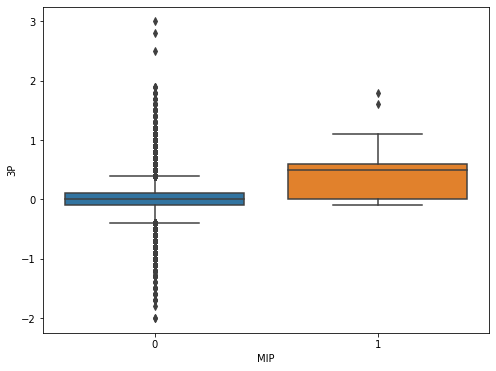

In [196]:
ax_3p = plt.figure(figsize = (8,6)).add_subplot(111)
sns.boxplot(x = season_change_df["MIP"], y = season_change_df["3P"], ax = ax_3p)
ax_age1.set_title("Y2Y improvement in 3P made  vs. Most Improved Player Award")